In [1]:
import pandas as pd
import numpy as np
import geopandas as gpd
import shapely
import matplotlib.pyplot as plt
import matplotlib.colors as mcm
import matplotlib.patches as mpatches
import folium

# Reading Data

In [2]:
ilcegdf = gpd.read_file("turkey_administrativelevels0_1_2/tur_polbna_adm2.shp")
istanbul = ilcegdf[ilcegdf.adm1_tr == "İSTANBUL"]

In [3]:
railstat = gpd.read_file("https://data.ibb.gov.tr/tr/dataset/271c7bdf-4b0c-4642-8e50-96acba3d4756/resource/a8ed96c5-6dae-49de-b28c-bf1b112f139a/download/2022-yl-rayl-ulam-istasyonlar-vektor-verisi.csv")
railstat = railstat.drop(columns = ["geometry", "GLOBALID"])
railstat = railstat.rename(columns={"SHAPE": "geometry", "ISIM_HAT": "line_name", "TUR_HAT": "type_tr",
                                   "ISIM_ISTASYON": "stat_name"})

In [4]:
railstat.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 327 entries, 0 to 326
Data columns (total 4 columns):
 #   Column     Non-Null Count  Dtype 
---  ------     --------------  ----- 
 0   line_name  327 non-null    object
 1   type_tr    327 non-null    object
 2   stat_name  327 non-null    object
 3   geometry   327 non-null    object
dtypes: object(4)
memory usage: 10.3+ KB


In [5]:
railstat["geometry"] = gpd.GeoSeries.from_wkt(railstat.geometry)
railstat = gpd.GeoDataFrame(railstat, crs = "EPSG:4326")

In [6]:
m = istanbul.explore(column = "adm2_tr", tooltip = "adm2_tr", popup = True,
                    tiles = "CartoDB positron", cmap = "Set3", legend = False,
                     style_kwds=dict(color="black", linewidth = 1))
railstat.explore(column = "line_name", 
                popup = True, color="red", marker_kwds=dict(radius=5, fill=True), 
                 tiles = "CartoDB positron", legend = False, m = m)
m

C:\Users\hilmi\AppData\Local\anaconda3\envs\geoenv\lib\site-packages\geopandas\explore.py:400: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  elif pd.api.types.is_categorical_dtype(gdf[column]):
C:\Users\hilmi\AppData\Local\anaconda3\envs\geoenv\lib\site-packages\geopandas\explore.py:400: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  elif pd.api.types.is_categorical_dtype(gdf[column]):



![Istanbul Metro Map](https://www.metro.istanbul/resim/resimad/raylisistemler-agharitasi-v3r17_5)

# Arranging Line Names

In [7]:
railstat.line_name.unique()

array(['İstanbul Banliyösü', 'Taksim - Tünel',
       'Şişhane - Atatürk Oto Sanayi', 'Yenikapı - Havaalanı',
       'Zeytinburnu - Kabataş', 'Karaköy - Beyoğlu', 'Kadıköy - Moda',
       'Haydarpaşa Banliyösü', 'Maçka - Taşkışla', 'Taksim - Kabataş',
       'Bağcılar - Kabataş', 'Şişhane - Yenikapı Metrosu',
       'Kadıköy - Kartal', 'Başakşehir - Olimpiyatköy',
       'Topkapı - Mescid-i Selam', 'Şişhane - Hacıosman',
       'Yenikapı - Kirazlı', 'Marmaray', 'Üsküdar - Çekmeköy',
       '(İnşaat Aşamasında)Bakırköy İDO - Kirazlı Metro Hattı',
       'Levent - Hisarüstü', 'Eyüp - Piyerloti',
       'Seyrantepe - Vadistanbul ', 'Eminönü - Alibeyköy',
       'Yıldız - Mahmutbey', 'Eminönü - Alibeyköy(İnşaat Aşamasında)',
       'Bahariye - Olimpiyat Metro',
       'Eminönü - Alibeyköy (İnşaat Aşamasında)',
       'Tavşantepe - Sabiha Gökçen', 'Bostancı - Dudullu',
       'Rumeli Hisarüstü - Aşiyan Füniküleri ', 'Kartal-Sabiha Gökçen',
       'Gayrettepe - İstanbul Havalimanı',
       '

İstanbul Banliyösü and Haydarpaşa Banliyösü were closed in 2013 after Marmaray was launched (https://tr.wikipedia.org/wiki/Sirkeci_banliyösü, https://tr.wikipedia.org/wiki/Haydarpaşa_banliyösü), so we're going to delete them.

In [8]:
changelines = {'Şişhane - Atatürk Oto Sanayi': 'Yenikapı - Hacıosman',
               'Yenikapı - Havaalanı' : "Yenikapı - Atatürk Havalimanı",
               'Zeytinburnu - Kabataş' : "Kabataş - Bağcılar", 'Bağcılar - Kabataş': "Kabataş - Bağcılar",
               'Şişhane - Yenikapı Metrosu' : "Yenikapı - Hacıosman",
               'Kadıköy - Kartal' : 'Kadıköy - Sabiha Gökçen Havalimanı',
               'Başakşehir - Olimpiyatköy' : np.nan, #we have to look for each station
               'Şişhane - Hacıosman' : 'Yenikapı - Hacıosman', 
               '(İnşaat Aşamasında)Bakırköy İDO - Kirazlı Metro Hattı': "Kirazlı Bağcılar - Bakırköy İDO Uzatması",
               'Levent - Hisarüstü' : "Levent - Boğaziçi Ü. Hisarüstü", 'Eyüp - Piyerloti': 'Eyüp - Piyer Loti',
               'Seyrantepe - Vadistanbul ': 'Seyrantepe - Vadistanbul', 
               'Eminönü - Alibeyköy(İnşaat Aşamasında)' : 'Eminönü - Alibeyköy',
               'Bahariye - Olimpiyat Metro': "Bahariye - Olimpiyat", 
               'Eminönü - Alibeyköy (İnşaat Aşamasında)': 'Eminönü - Alibeyköy',
               'Tavşantepe - Sabiha Gökçen': 'Kadıköy - Sabiha Gökçen Havalimanı',
               'Bostancı - Dudullu': 'Bostancı - Parseller',
               'Rumeli Hisarüstü - Aşiyan Füniküleri ': "Boğaziçi Ü. Hisarüstü - Aşiyan",
               'Kartal-Sabiha Gökçen': 'Kadıköy - Sabiha Gökçen Havalimanı',
               "Marmaray": 'Marmaray (Halkalı - Gebze)', 'Marmaray (Halkalı-Bahçeşehir)': 'Marmaray (Halkalı - Bahçeşehir)'
               }
removelist = ['İstanbul Banliyösü', 'Haydarpaşa Banliyösü', '(İnşaat Aşamasında)Bakırköy İDO - Kirazlı Metro Hattı']

railstat = railstat[~railstat.line_name.isin(removelist)] # dropping removelist
railstat = railstat.reset_index(drop=True)
railstat["line_name"] = railstat.line_name.replace(changelines) # changing names

In [9]:
railstat[railstat.isna().any(axis=1)]

,line_name,type_tr,stat_name,geometry
40,NaN,Metro,İstoç,POINT (28.82596 41.06500)
41,NaN,Metro,Turgut Özal,POINT (28.79741 41.08118)
42,NaN,Metro,İkitelli Sanayi,POINT (28.80244 41.07247)
43,NaN,Metro,Başak Konutları,POINT (28.79129 41.09767)
74,NaN,Metro,Yenimahalle,POINT (28.83594 41.04036)
126,NaN,Metro,Siteler,POINT (28.79651 41.08820)
191,NaN,Metro,Mahmutbey,POINT (28.83053 41.05484)
192,NaN,Metro,Ziya Gökalp Mah.,POINT (28.78653 41.07448)
193,NaN,Metro,Olimpiyat,POINT (28.76726 41.07963)
200,NaN,Metro,Başakşehir - Metrokent,POINT (28.80148 41.10759)


In [10]:
railstat.loc[railstat.stat_name.isin(["Ziya Gökalp Mah.", "Olimpiyat"]), "line_name"] = "Bahariye - Olimpiyat"
railstat["line_name"] = railstat.line_name.fillna("Kirazlı - Kayaşehir Merkez") #others are in this line

# Arranging Station Numbers

In [11]:
samewithM1B = railstat[railstat.stat_name.isin(["Yenikapı", "Aksaray", "Emniyet - Fatih", "Topkapı - Ulubatlı",
                                            "Bayrampaşa - Maltepe", "Sağmalcılar", "Kocatepe", "Otogar"])]
samewithM1B = samewithM1B[samewithM1B.line_name == "Yenikapı - Atatürk Havalimanı"]
samewithM1B["line_name"] = "Yenikapı - Kirazlı"
railstat = pd.concat([railstat, samewithM1B])

halkali = railstat[railstat.stat_name == "Halkalı"]
halkali["line_name"] = "Marmaray (Halkalı - Bahçeşehir)"
railstat = pd.concat([railstat, halkali])

C:\Users\hilmi\AppData\Local\anaconda3\envs\geoenv\lib\site-packages\geopandas\geodataframe.py:1538: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  super().__setitem__(key, value)


In [12]:
railstat[railstat.stat_name == "Kabataş"]

,line_name,type_tr,stat_name,geometry
53,Kabataş - Bağcılar,Tramway,Kabataş,POINT (28.99268 41.03444)
56,Taksim - Kabataş,Funiküler,Kabataş,POINT (28.99194 41.03404)
249,Yıldız - Mahmutbey,Metro,Kabataş,POINT (28.99075 41.03357)


In [13]:
railstat = railstat.drop(railstat[railstat.stat_name == "Kabataş"][railstat.line_name == "Yıldız - Mahmutbey"].index)
railstat.loc[railstat.stat_name == "", "stat_name"] = "Fulya"

C:\Users\hilmi\AppData\Local\anaconda3\envs\geoenv\lib\site-packages\geopandas\geodataframe.py:1475: UserWarning: Boolean Series key will be reindexed to match DataFrame index.
  result = super().__getitem__(key)


In [14]:
txt = """
FOR THIS LINE: Bahariye - Olimpiyat
Ziya Gökalp Mah.---> number of 4
Olimpiyat---> number of 5
İkitelli Sanayi---> number of 3
Bahariye---> number of 1
Masko---> number of 2

-----------------------

FOR THIS LINE: Bostancı - Parseller
Kayışdağı---> number of 7
İmes---> number of 9
Mevlana---> number of 8
Bostancı---> number of 1
Emin Ali Paşa---> number of 2
Ayşe Kadın---> number of 3
Parseller---> number of 13
Dudullu---> number of 11
Modoko - Keyap---> number of 10
Kozyatağı---> number of 4
Küçükbakkalköy---> number of 5
Huzur---> number of 12
İçerenköy---> number of 6

-----------------------

FOR THIS LINE: Boğaziçi Ü. Hisarüstü - Aşiyan
Rumeli Hisarüstü---> number of 1
Aşiyan---> number of 2

-----------------------

FOR THIS LINE: Eminönü - Alibeyköy
Alibeyköy Merkez---> number of 12
Eminönü---> number of 1
Eyüpsultan Devlet Hastanesi---> number of 9
Alibeyköy Metro---> number of 13
Cibali---> number of 3
Eyüpsultan Teleferik---> number of 8
Silahtarağa Mahallesi---> number of 10
Fener---> number of 4
Feshane---> number of 7
Ayvansaray---> number of 6
Cep Otogarı---> number of 14
Küçükpazar---> number of 2
Sakarya Mahallesi---> number of 11
Balat---> number of 5

-----------------------

FOR THIS LINE: Eyüp - Piyer Loti
Piyerloti---> number of 2
Eyüp---> number of 1

-----------------------

FOR THIS LINE: Gayrettepe - İstanbul Havalimanı
Hasdal---> number of 3
Göktürk---> number of 5
Yeni Havalimanı - 3---> number of 8
Kağıthane---> number of 2
Yeni Havalimanı - 2---> number of 7
İhsaniye---> number of 6
Kemerburgaz---> number of 4
Yeni Havalimanı - 1---> number of 7

-----------------------

FOR THIS LINE: Kabataş - Bağcılar
Aksaray---> number of 12
Mithatpaşa---> number of 22
Çemberlitaş---> number of 9
Cevizlibağ - AÖY---> number of 19
Gülhane---> number of 7
Çapa - Şehremini---> number of 16
Akıncılar---> number of 27
Sirkeci---> number of 6
Topkapı---> number of 18
Pazartekke---> number of 17
Kabataş---> number of 1
Tophane---> number of 3
Karaköy---> number of 4
Mehmet Akif---> number of 24
Güngören---> number of 26
Soğanlı---> number of 28
Güneştepe---> number of 30
Bağcılar---> number of 31
Beyazıt - Kapalıçarşı---> number of 10
Merter Teks. Mrk.---> number of 25
Seyitnizam - Akşemsettin---> number of 21
Yavuz Selim---> number of 29
Sultanahmet---> number of 8
Merkezefendi---> number of 20
Laleli - İstanbul Ü.---> number of 11
Fındıklı - Mimar Sinan Ü.---> number of 2
Yusufpaşa---> number of 13
Eminönü---> number of 5
Fındıkzade---> number of 15
Haseki---> number of 14
Zeytinburnu---> number of 23

-----------------------

FOR THIS LINE: Kadıköy - Moda
Demirkapı---> number of 6
Hacı Şükrü---> number of 18
İskele Cami---> number of 11
Çarşı---> number of 10
Altıyol---> number of 9
Bahariye---> number of 8
Moda İlkokulu---> number of 6
Mühürdar---> number of 3
Damga Sokak---> number of 2
Kadıköy İDO---> number of 1
Kilise---> number of 7
Moda---> number of 5

-----------------------

FOR THIS LINE: Kadıköy - Sabiha Gökçen Havalimanı
Bostancı---> number of 8
Kozyatağı---> number of 7
Esenkent---> number of 13
Tavşantepe---> number of 19
Pendik---> number of 18
Yakacık - Adnan Kahveci---> number of 17
Ayrılık Çeşmesi---> number of 2
Kadıköy---> number of 1
Acıbadem---> number of 3
Göztepe---> number of 5
Ünalan---> number of 4
Yenisahra---> number of 6
Küçükyalı---> number of 9
Maltepe---> number of 10
Huzurevi---> number of 11
Gülsuyu---> number of 12
Hastane - Adliye---> number of 14
Soğanlık---> number of 15
Kartal---> number of 16
Yayalar---> number of 21
Sabiha Gökçen---> number of 23
Fevzi Çakmak---> number of 20
Kurtköy---> number of 22

-----------------------

FOR THIS LINE: Karaköy - Beyoğlu
Karaköy---> number of 1
Beyoğlu---> number of 2

-----------------------

FOR THIS LINE: Kirazlı - Kayaşehir Merkez
İstoç---> number of 4
Turgut Özal---> number of 6
İkitelli Sanayi---> number of 5
Başak Konutları---> number of 8
Yenimahalle---> number of 2
Siteler---> number of 7
Mahmutbey---> number of 3
Başakşehir - Metrokent---> number of 9

-----------------------

FOR THIS LINE: Levent - Boğaziçi Ü. Hisarüstü
Levent---> number of 1
Etiler---> number of 3
Boğaziçi Ü. - Hisarüstü---> number of 4
Nisbetiye---> number of 2

-----------------------

FOR THIS LINE: Marmaray (Halkalı - Gebze)
Küçükçekmece---> number of 3
Tuzla---> number of 38
Yunus---> number of 31
Başak---> number of 29
Kartal---> number of 30
Kaynarca---> number of 33
Gebze---> number of 43
Bostancı---> number of 22
Osmangazi---> number of 41
Florya Akvaryum---> number of 5
Güzelyalı---> number of 35
Yenimahalle---> number of 10
Göztepe---> number of 19
Bakırköy---> number of 9
Yeşilköy---> number of 6
Yeşilyurt---> number of 7
Pendik---> number of 32
Maltepe---> number of 26
Florya---> number of 4
Aydıntepe---> number of 36
Halkalı---> number of 1
Darıca---> number of 42
Fatih---> number of 
Cevizli---> number of 27
Ataköy---> number of 8
Süreyya Plajı---> number of 25
Atalar---> number of 28
İdealtepe---> number of 24
Mustafa Kemal---> number of 2
Feneryolu---> number of 18
Küçükyalı---> number of 23
Çayırova---> number of 39
İçmeler---> number of 37
Zeytinburnu---> number of 11
Suadiye---> number of 21
Tersane---> number of 34
Söğütlüçeşme---> number of 17
Erenköy---> number of 20
Yenikapı---> number of 13
Kazlıçeşme---> number of 12
Sirkeci---> number of 14
Ayrılıkçeşme---> number of 16
Üsküdar---> number of 15

-----------------------

FOR THIS LINE: Marmaray (Halkalı - Bahçeşehir)
Bahçeşehir---> number of 5
Altınşehir---> number of 3
Konut Birlik---> number of 2
Ispartakule---> number of 4
Halkalı---> number of 1

-----------------------

FOR THIS LINE: Maçka - Taşkışla
Maçka---> number of 1
Taşkışla---> number of 2

-----------------------

FOR THIS LINE: Seyrantepe - Vadistanbul
Seyrantepe---> number of 1
Vadistanbul---> number of 2

-----------------------

FOR THIS LINE: Taksim - Kabataş
Taksim---> number of 1
Kabataş---> number of 2

-----------------------

FOR THIS LINE: Taksim - Tünel
Ağa Camii---> number of 2
Odakule---> number of 4
Taksim---> number of 1
Tünel---> number of 5
Galatasaray Lisesi---> number of 3

-----------------------

FOR THIS LINE: Topkapı - Mescid-i Selam
Edirnekapı---> number of 4
Karadeniz---> number of 14
Sultançiftliği---> number of 20
Bosna - Çukurçeşme---> number of 11
Sağmalcılar---> number of 10
Fetihkapı---> number of 2
Rami---> number of 8
Topçular---> number of 7
Şehitlik---> number of 5
Demirkapı---> number of 6
Yenimahalle---> number of 19
Taşköprü---> number of 13
Mescid-i Selam---> number of 22
Cumhuriyet Mahallesi---> number of 16
Topkapı---> number of 1
50. Yıl - Baştabya---> number of 17
Ali Fuat Başgil---> number of 12
Vatan---> number of 3
KİPTAŞ Venezia---> number of 15
Cebeci---> number of 21
Hacı Şükrü---> number of 18
Uluyol - Bereç---> number of 9

-----------------------

FOR THIS LINE: Yenikapı - Atatürk Havalimanı
Merter---> number of 11
Bayrampaşa - Maltepe---> number of 5
Aksaray---> number of 2
Ataköy - Şirinevler---> number of 15
Kocatepe---> number of 7
Bahçelievler---> number of 14
Zeytinburnu---> number of 12
Terazidere---> number of 9
Emniyet - Fatih---> number of 3
Topkapı - Ulubatlı---> number of 4
Atatürk Havalimanı---> number of 18
Yenibosna---> number of 16
DTM - İstanbul Fuar Merkezi---> number of 17
Sağmalcılar---> number of 6
Yenikapı---> number of 1
Bakırköy - İncirli---> number of 13
Davutpaşa - YTÜ---> number of 10
Otogar---> number of 8

-----------------------

FOR THIS LINE: Yenikapı - Hacıosman
4. Levent---> number of 10
Taksim---> number of 5
Sanayi Mahallesi---> number of 11
Şişhane---> number of 4
Haliç---> number of 3
İTÜ - Ayazağa---> number of 12
Şişli - Mecidiyeköy---> number of 7
Darüşşafaka---> number of 14
Hacıosman---> number of 15
Yenikapı---> number of 1
Levent---> number of 9
Gayrettepe---> number of 8
Vezneciler - İstanbul Ü.---> number of 2
Atatürk Oto Sanayi---> number of 13
Seyrantepe---> number of 16
Osmanbey---> number of 6

-----------------------

FOR THIS LINE: Yenikapı - Kirazlı
Kirazlı Bağcılar---> number of 13
Esenler---> number of 9
Bağcılar Meydan---> number of 12
Menderes---> number of 9
Üçyüzlü---> number of 10
Bayrampaşa - Maltepe---> number of 5
Aksaray---> number of 2
Kocatepe---> number of 7
Emniyet - Fatih---> number of 3
Topkapı - Ulubatlı---> number of 4
Sağmalcılar---> number of 6
Yenikapı---> number of 1
Otogar---> number of 8

-----------------------

FOR THIS LINE: Yıldız - Mahmutbey
Tekstilkent - Giyimkent---> number of 14
Mahmutbey---> number of 17
Yenimahalle---> number of 12
Karadeniz Mah.---> number of 13
Kağıthane---> number of 5
Yeşilpınar---> number of 10
Mecidiyeköy---> number of 3
Kazım Karabekir---> number of 11
Oruç Reis - Yüzyıl---> number of 15
Nurtepe---> number of 6
Çağlayan---> number of 4
Alibeyköy---> number of 7
Veysel Karani - Akşemsettin---> number of 9
Göztepe Mah.---> number of 16
Çırçır Mah.---> number of 8
Fulya---> number of 2
Yıldız---> number of 1

-----------------------

FOR THIS LINE: Üsküdar - Çekmeköy
Dudullu---> number of 14
İmam Hatip---> number of 13
Çakmak---> number of 10
Çekmeköy---> number of 16
Altınşehir---> number of 12
Ihlamurkuyu---> number of 11
Necip Fazıl---> number of 15
Bulgurlu---> number of 6
Ümraniye---> number of 7
Kısıklı---> number of 5
Yamanevler---> number of 9
Üsküdar---> number of 1
Bağlarbaşı---> number of 3
Altunizade---> number of 4
Çarşı---> number of 8
Fıstık Ağacı---> number of 2
"""

linedict= {}
for subtxt in txt.split("""\n-----------------------\n"""):
    subtxt = subtxt.strip()
    stat_nolist = []
    for i in subtxt.split("\n"):
        if i.startswith("FOR THIS LINE: "):
            line = i[i.index("FOR THIS LINE: ")+len("FOR THIS LINE: "):]
        elif i == " ":
            continue
        else:
            if i[i.index("---> number of")+len("---> number of"):] == "" or \
            i[i.index("---> number of")+len("---> number of"):] == " " or i == '' or i == " ":
                stat_nolist.append(np.nan)
            else:
                stat_nolist.append(int(i[i.index("---> number of")+len("---> number of"):]))
    linedict[line] = stat_nolist

In [15]:
newlist = []
for line, linegdf in railstat.groupby("line_name"):
    linegdf["stat_no"] = linedict[line]
    newlist.append(linegdf)
railstat = pd.concat(newlist, ignore_index = True)

In [16]:
railstat[railstat.isna().any(axis=1)]

,line_name,type_tr,stat_name,geometry,stat_no
151,Marmaray (Halkalı - Gebze),Marmaray,Fatih,POINT (29.36393 40.80763),NaN


In [17]:
railstat[railstat.isna().any(axis=1)].explore(marker_kwds=dict(radius=15, fill=True))

In [18]:
railstat.loc[railstat.isna().any(axis=1), "stat_no"] = 40

# Arranging Station Names

In [19]:
arrangedict = {"Masko": "MASKO", "İmes": "İMES", "Ayşe Kadın": "Ayşekadın", "Modoko - Keyap": "MODOKO KEYAP",
               "Rumeli Hisarüstü": "Boğaziçi Ü. - Hisarüstü", "Cep Otogarı": "Alibeyköy Cep Otogarı",
               "Sakarya Mahallesi": "Üniversite", "Piyerloti": "Piyer Loti", "Yeni Havalimanı - 3": "Kargo Terminali",
                "Yeni Havalimanı - 1": "İstanbul Havalimanı",
               "Yayalar": "Yayalar - Şeyhli", "Sabiha Gökçen": "Sabiha Gökçen Havalimanı", "Fevi Çakmak": "Fevzi Çakmak - Hastane",
               "İstoç": "İSTOÇ", "Nisbetiye": "Nispetiye", "Ayrılıkçeşme": "Ayrılık Çeşmesi", "İmam Hatip": "İmam Hatip Lisesi",
               "Fıstık Ağacı": "Fıstıkağacı", "Merter Teks. Merk.": "Merter Tekstil Merkezi", "Fatih": "Gebze Teknik Üniversitesi - Fatih",
               "Ağa Camii": "Hüseyin Ağa Camii", "Oruç Reis - Yüzyıl": "Oruç Reis"}
linestatdict = {"Demirkapı": "Topkapı - Mescid-i Selam", "Hacı Şükrü": "Topkapı - Mescid-i Selam"}
removelist = ["Yeni Havalimanı - 2"]
railstat = railstat[~railstat.stat_name.isin(removelist)]
railstat = railstat.replace(arrangedict)

In [20]:
railstat[railstat.stat_name.isin(linestatdict.keys())]

,line_name,type_tr,stat_name,geometry,stat_no
75,Kadıköy - Moda,Nostaljik Tramway,Demirkapı,POINT (28.97839 41.01201),6.0
76,Kadıköy - Moda,Nostaljik Tramway,Hacı Şükrü,POINT (28.76726 41.07963),18.0
192,Topkapı - Mescid-i Selam,Tramway,Demirkapı,POINT (28.92335 41.03704),6.0
203,Topkapı - Mescid-i Selam,Tramway,Hacı Şükrü,POINT (28.86400 41.09286),18.0


In [21]:
railstat[railstat.stat_name.isin(linestatdict.keys())].explore(marker_kwds=dict(radius=15, fill=True))

In [22]:
railstat[railstat.stat_name == "Gülhane"].explore(marker_kwds=dict(radius=15, fill=True))
# Demirkapı station in the line of Kadıköy - Moda is actually Gülhane station in Kabataş - Bağcılar Tram. So we can delete it.

In [23]:
railstat[railstat.stat_name == "Olimpiyat"].explore(marker_kwds=dict(radius=15, fill=True))
# Hacı Şükrü station in the line of Kadıköy - Moda is actually Olimpiyat station in Bahariye - Olimpiyat Metro. So we can delete it.

In [24]:
railstat = railstat.drop([75,76]) # index no of wrong stations
railstat = railstat.reset_index(drop = True)

# Arranging Line Codes

In [26]:
linecoded = {"Taksim - Tünel" : "T2", "Yenikapı - Hacıosman" : "M2", "Yenikapı - Atatürk Havalimanı" : "M1A",
             "Kabataş - Bağcılar": "T1", 'Karaköy - Beyoğlu' : "F2", 'Kadıköy - Moda' : "T3", 
             'Maçka - Taşkışla' : "TF1", 'Taksim - Kabataş': "F1", 
             'Kadıköy - Sabiha Gökçen Havalimanı': "M4", "Kirazlı - Kayaşehir Merkez": "M3",
             "Bahariye - Olimpiyat": "M9", 'Topkapı - Mescid-i Selam': "T4", 'Yenikapı - Kirazlı': "M1B",
             'Marmaray (Halkalı - Gebze)': "B1", 'Üsküdar - Çekmeköy': "M5", "Kirazlı Bağcılar - Bakırköy İDO Uzatması" : "M3",
             "Levent - Boğaziçi Ü. Hisarüstü": "M6", 'Eyüp - Piyer Loti': "TF2", 
             'Seyrantepe - Vadistanbul': "F3", 'Eminönü - Alibeyköy': "T5", 'Yıldız - Mahmutbey': "M7",
             'Bostancı - Parseller' : "M8", "Boğaziçi Ü. Hisarüstü - Aşiyan" : "F4",
             'Gayrettepe - İstanbul Havalimanı' : "M11", 'Marmaray (Halkalı - Bahçeşehir)': "B2"
            }
railstat["line_code"] = railstat.line_name.replace(linecoded)

In [27]:
railstat[railstat.isna().any(axis=1)]

,line_name,type_tr,stat_name,geometry,stat_no,line_code


# Arranging Rail Type
According to the map, the type of railway lines are metro, cable car, tram, heritage tram, funicular line, heritage funicular, suburban line. Bus rapid transit (Metrobüs) is not in our data, since it is not in the railway network.

In [29]:
railstat.type_tr.unique()

array(['Metro', 'Funiküler', 'Tramway', 'Teleferik', 'Nostaljik Tramway',
       'Marmaray', 'Nostaljik Tramvay', 'Hafif Metro'], dtype=object)

In [31]:
linetypetrdict = {'Hafif Metro': np.nan, # we'll look after
                  'Tramway': "Tramvay", 'Funiküler': 'Füniküler',
                  'Nostaljik Tramway': 'Nostaljik Tramvay', 
                  'Marmaray': "Banliyö", '': np.nan}
linetypeengdict = {"Teleferik": "Cable Car", "Tramvay": "Tram", 
                   'Nostaljik Tramvay': 'Heritage Tram', 
                   "Füniküler": "Funicular", "Banliyö": "Suburban",
                   "Tarihi Füniküler": "Heritage Funicular"}
railstat["type_tr"] = railstat.type_tr.replace(linetypetrdict)

In [32]:
railstat[railstat.isna().any(axis=1)]

,line_name,type_tr,stat_name,geometry,stat_no,line_code
202,Yenikapı - Atatürk Havalimanı,NaN,Merter,POINT (28.89616 41.00762),11.0,M1A
203,Yenikapı - Atatürk Havalimanı,NaN,Bayrampaşa - Maltepe,POINT (28.92022 41.03410),5.0,M1A
204,Yenikapı - Atatürk Havalimanı,NaN,Aksaray,POINT (28.94801 41.01183),2.0,M1A
205,Yenikapı - Atatürk Havalimanı,NaN,Ataköy - Şirinevler,POINT (28.84600 40.99136),15.0,M1A
206,Yenikapı - Atatürk Havalimanı,NaN,Kocatepe,POINT (28.89538 41.04844),7.0,M1A
207,Yenikapı - Atatürk Havalimanı,NaN,Bahçelievler,POINT (28.86345 40.99537),14.0,M1A
208,Yenikapı - Atatürk Havalimanı,NaN,Zeytinburnu,POINT (28.88975 41.00171),12.0,M1A
209,Yenikapı - Atatürk Havalimanı,NaN,Terazidere,POINT (28.89796 41.03032),9.0,M1A
210,Yenikapı - Atatürk Havalimanı,NaN,Emniyet - Fatih,POINT (28.93907 41.01809),3.0,M1A
211,Yenikapı - Atatürk Havalimanı,NaN,Topkapı - Ulubatlı,POINT (28.93016 41.02427),4.0,M1A


In [33]:
railstat["type_tr"] = railstat.type_tr.fillna("Metro")
railstat["type_eng"] = railstat.type_tr.replace(linetypeengdict)

# Exporting Rail Stations Data

In [34]:
#railstat = railstat.rename(columns={"line_type_tr": "type_tr", "line_type_eng": "type_eng",
#                                    "line": "line_name", "name": "stat_name"})
railstat.to_file("istanbul_railway_stations_2024.shp", encoding = "UTF-8")

# Creating Rail Lines

In [35]:
m = istanbul.explore(column = "adm2_tr", tooltip = "adm2_tr", popup = True,
                    tiles = "CartoDB positron", cmap = "Set3", legend = False,
                     style_kwds=dict(color="black", linewidth = 1))
railstat.explore(column = "line_name", 
                popup = True, color="red", marker_kwds=dict(radius=5, fill=True), 
                 tiles = "CartoDB positron", legend = False, m = m)
m

C:\Users\hilmi\AppData\Local\anaconda3\envs\geoenv\lib\site-packages\geopandas\explore.py:400: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  elif pd.api.types.is_categorical_dtype(gdf[column]):
C:\Users\hilmi\AppData\Local\anaconda3\envs\geoenv\lib\site-packages\geopandas\explore.py:400: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  elif pd.api.types.is_categorical_dtype(gdf[column]):


In [36]:
railway = railstat.drop(columns=["stat_name", "geometry", "stat_no"]).drop_duplicates(ignore_index = True)

<AxesSubplot:>

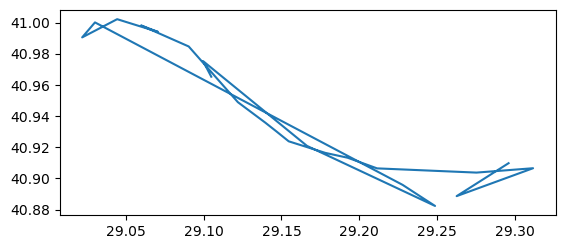

In [43]:
s = gpd.GeoSeries(shapely.geometry.LineString(railstat[railstat.line_code == "M4"].geometry))
s.plot()

<AxesSubplot:>

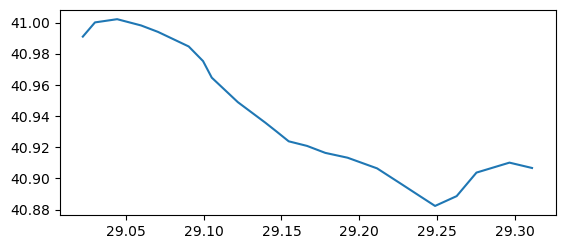

In [44]:
railstat.loc[railstat.line_name == line].sort_values("stat_no")
s = gpd.GeoSeries(shapely.geometry.LineString(railstat.loc[railstat.line_code == "M4"].sort_values("stat_no").geometry))
s.plot()

In [37]:
line_statlist = []
for line in railway.line_name:
    df = railstat.loc[railstat.line_name == line].sort_values("stat_no")
    stat_names = df.stat_name.tolist()
    line_statlist.append(",".join(stat_names))
railway["stations"] = line_statlist

In [45]:
railway = railway.sort_values(by = "line_code", ignore_index=True)
railway

,line_name,type_tr,line_code,type_eng,stations
0,Marmaray (Halkalı - Gebze),Banliyö,B1,Suburban,"Halkalı,Mustafa Kemal,Küçükçekmece,Florya,Flor..."
1,Marmaray (Halkalı - Bahçeşehir),Banliyö,B2,Suburban,"Halkalı,Konut Birlik,Altınşehir,Ispartakule,Ba..."
2,Taksim - Kabataş,Füniküler,F1,Funicular,"Taksim,Kabataş"
3,Karaköy - Beyoğlu,Füniküler,F2,Funicular,"Karaköy,Beyoğlu"
4,Seyrantepe - Vadistanbul,Füniküler,F3,Funicular,"Seyrantepe,Vadistanbul"
5,Boğaziçi Ü. Hisarüstü - Aşiyan,Füniküler,F4,Funicular,"Boğaziçi Ü. - Hisarüstü,Aşiyan"
6,Gayrettepe - İstanbul Havalimanı,Metro,M11,Metro,"Kağıthane,Hasdal,Kemerburgaz,Göktürk,İhsaniye,..."
7,Yenikapı - Atatürk Havalimanı,Metro,M1A,Metro,"Yenikapı,Aksaray,Emniyet - Fatih,Topkapı - Ulu..."
8,Yenikapı - Kirazlı,Metro,M1B,Metro,"Yenikapı,Aksaray,Emniyet - Fatih,Topkapı - Ulu..."
9,Yenikapı - Hacıosman,Metro,M2,Metro,"Yenikapı,Vezneciler - İstanbul Ü.,Haliç,Şişhan..."


In [46]:
geolist = []
for line in railway.line_name:
    df = railstat.loc[railstat.line_name == line].sort_values("stat_no")
    if line == "Yenikapı - Hacıosman":
        # Sanayi Mahallesi and Seyrantepe has to be a different line
        linegeo1 = shapely.geometry.LineString(df.geometry.iloc[:-1])
        linegeo2 = shapely.geometry.LineString(railstat.loc[railstat.line_name == "Yenikapı - Hacıosman"].sort_values("stat_no").iloc[[10,15], :].geometry)
        linegeo = shapely.geometry.MultiLineString([linegeo1, linegeo2])
    else:
        linegeo = shapely.geometry.LineString(df.geometry)
    geolist.append(linegeo)
railway["geometry"] = geolist
railway = gpd.GeoDataFrame(railway, geometry = "geometry", crs = "EPSG:4326")

In [47]:
railway["color"] = ['dimgrey', 'darkgrey', 'olive', 'olive', 'olive', "olive", "mediumorchid",
          "red", "red", "forestgreen", "cyan", "deeppink", "indigo", "tan", "pink",
          "cornflowerblue", "yellow", "mediumblue", "silver", "peru", "darkorange",
          "mediumslateblue", "mediumturquoise", "mediumturquoise"]

# Exporting Railway Data

In [48]:
railway.to_file("istanbul_railway_lines_2024.shp", encoding = "UTF-8")

# Plotting

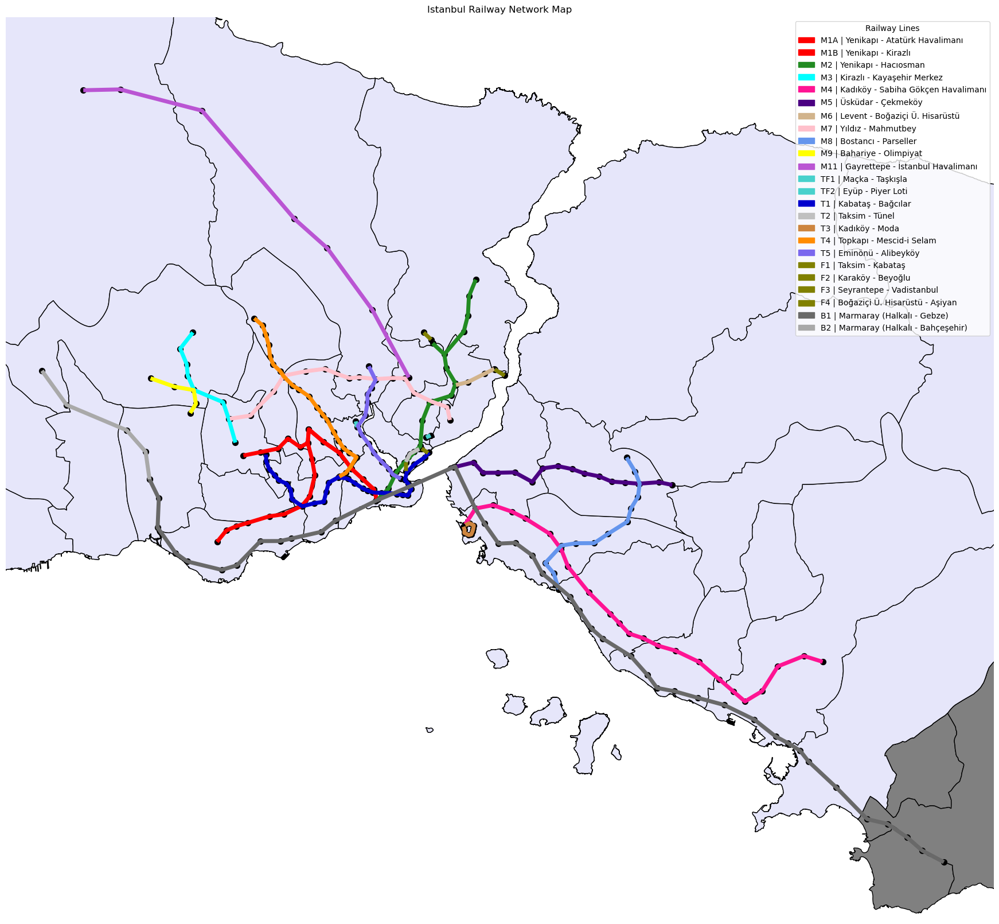

In [56]:
sort_list = ["M1A", "M1B", "M2", "M3", "M4", "M5", "M6", "M7", "M8", "M9", "M11", "TF1", "TF2",
             "T1" , "T2", "T3", "T4", "T5", "F1", "F2", "F3", "F4", "B1", "B2"]

f, ax = plt.subplots(figsize = (20,16))
ilcegdf.plot(ax=ax, facecolor = "gray", edgecolor = "black")
istanbul.plot(ax=ax, facecolor = "lavender", edgecolor = "black")

lineslst = []
for code in sort_list:
    subgdf = railway[railway.line_code == code] # for each railway line code
    l = subgdf.plot(ax=ax, color = subgdf.color.tolist()[0], linewidth = 5)
    # for creating legend for each line
    l = mpatches.Patch(color = subgdf.color.tolist()[0],
                       label = code + " | " + subgdf.line_name.tolist()[0])
    lineslst.append(l)
railstat.plot(ax=ax, color = "black", markersize=50)
plt.xlim(28.65, 29.45)
plt.ylim(40.75, 41.3)
ax.set_axis_off()
ax.set_facecolor("cornflowerblue")
ax.legend(handles = lineslst, title = "Railway Lines")
f.tight_layout()
plt.title("Istanbul Railway Network Map")
plt.savefig("Istanbul_Railway_Network_Map.png")
plt.show()

In [50]:
m = istanbul.explore(column = "adm2_tr", tooltip = "adm2_tr", popup = True,
                    tiles = "CartoDB positron", color = "none", legend = False,
                     style_kwds=dict(color="black", linewidth = 1))
cmap = mcm.ListedColormap(railway.color.tolist())
railway.explore(column = "line_name", 
                popup = True, cmap = cmap,
                 tiles = "CartoDB positron", m = m)
railstat.explore(column = "line_name", cmap = cmap,
                popup = True, marker_kwds=dict(radius=10, fill=True), 
                 tiles = "CartoDB positron", legend = False, m = m)
m.save('metro_lines_map.html')
m

C:\Users\hilmi\AppData\Local\anaconda3\envs\geoenv\lib\site-packages\geopandas\explore.py:400: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  elif pd.api.types.is_categorical_dtype(gdf[column]):
C:\Users\hilmi\AppData\Local\anaconda3\envs\geoenv\lib\site-packages\geopandas\explore.py:400: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  elif pd.api.types.is_categorical_dtype(gdf[column]):
C:\Users\hilmi\AppData\Local\anaconda3\envs\geoenv\lib\site-packages\geopandas\explore.py:400: FutureWarning: is_categorical_dtype is deprecated and will be removed in a future version. Use isinstance(dtype, CategoricalDtype) instead
  elif pd.api.types.is_categorical_dtype(gdf[column]):


In [51]:
m = folium.Map([41,29], zoom_start=10, tiles = "CartoDB positron")
for i, line in railway.iterrows():
    print(line.color)
    folium.GeoJson(line.geometry, name=line.name, 
                   style_function=lambda x, fillColor=line.color, 
                    color=line.color: {"fillColor": line.color, "color": line.color}).add_to(m)
folium.LayerControl().add_to(m)
#m.save('metro_lines_map.html')  # Save the map as an HTML file
m

dimgrey
darkgrey
olive
olive
olive
olive
mediumorchid
red
red
forestgreen
cyan
deeppink
indigo
tan
pink
cornflowerblue
yellow
mediumblue
silver
peru
darkorange
mediumslateblue
mediumturquoise
mediumturquoise


In [61]:
def plot_railline(line_name, figsize = (30,16), ilce_color = "gray", istanbul_color = "lavender"):
    color = railway[railway.line_name == line_name].color.tolist()[0]
    line_code = railway[railway.line_name == line_name].line_code.tolist()[0]
    
    f, ax = plt.subplots(figsize = figsize)
    ilcegdf.plot(ax=ax, facecolor = ilce_color, edgecolor = "black")
    istanbul.plot(ax=ax, facecolor = istanbul_color, edgecolor = "black")
    railstat[railstat.line_name == line_name].plot(ax=ax, color = color,  marker = "o", markersize=50)
    railway[railway.line_name == line_name].plot(ax=ax, color = color, linewidth = 5)
    txt_frame = railway[railway.line_name == line_name].geometry.length.iloc[0] / 100
    for _, i in railstat[railstat.line_name == line_name].iterrows():
        ax.text(i.geometry.centroid.x, i.geometry.centroid.y+txt_frame, i.stat_name,
                horizontalalignment='center', verticalalignment='center', fontsize = 'small',
                bbox={'facecolor':'white','alpha':1,'edgecolor':'none','pad':1})
    for _, i in istanbul.clip(railway[railway.line_name == line_name].geometry.bounds.iloc[0]).iterrows():
        ax.text(i.geometry.centroid.x, i.geometry.centroid.y,  i.adm2_tr,
               horizontalalignment='center', verticalalignment='center', fontsize = 'large')
    minx, miny, maxx, maxy = railway[railway.line_name == line_name].geometry.bounds.iloc[0]
    frame = railway[railway.line_name == line_name].geometry.length.iloc[0] / 50
    plt.xlim(minx-frame, maxx+frame)
    plt.ylim(miny-frame, maxy+frame)
    ax.set_facecolor("cornflowerblue")
    plt.title("Map of "+line_code+" - "+line_name)
    plt.savefig(line_code+"_"+line_name+".png")
    ax.set_axis_off()
    f.tight_layout()
    plt.show()

C:\Users\hilmi\AppData\Local\Temp\ipykernel_10432\466362186.py:10: UserWarning: Geometry is in a geographic CRS. Results from 'length' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  txt_frame = railway[railway.line_name == line_name].geometry.length.iloc[0] / 100
C:\Users\hilmi\AppData\Local\anaconda3\envs\geoenv\lib\site-packages\geopandas\tools\clip.py:182: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ((box_mask[0] <= box_gdf[2]) and (box_gdf[0] <= box_mask[2]))
C:\Users\hilmi\AppData\Local\anaconda3\envs\geoenv\lib\site-packages\geopandas\tools\clip.py:183: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame beha

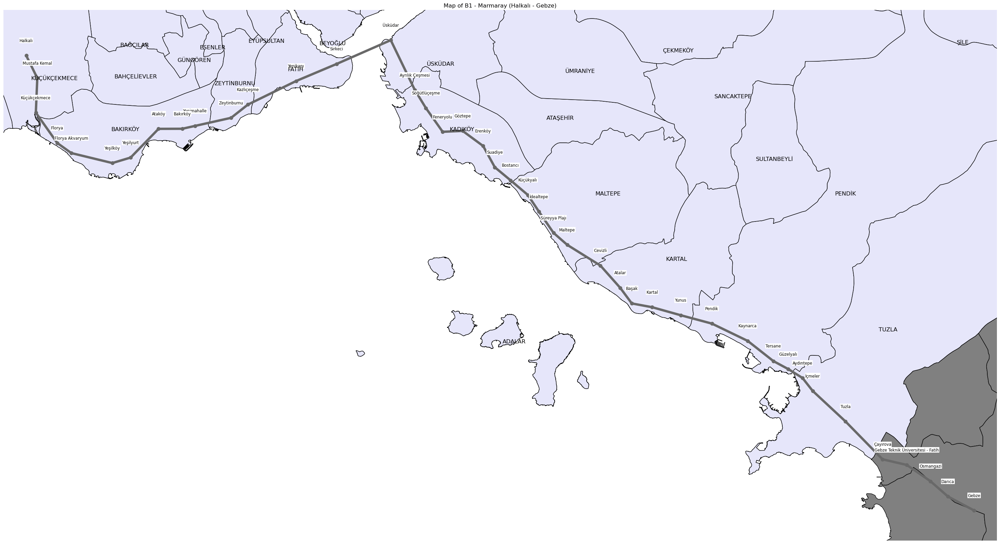

C:\Users\hilmi\AppData\Local\Temp\ipykernel_10432\466362186.py:10: UserWarning: Geometry is in a geographic CRS. Results from 'length' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  txt_frame = railway[railway.line_name == line_name].geometry.length.iloc[0] / 100
C:\Users\hilmi\AppData\Local\anaconda3\envs\geoenv\lib\site-packages\geopandas\tools\clip.py:182: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ((box_mask[0] <= box_gdf[2]) and (box_gdf[0] <= box_mask[2]))
C:\Users\hilmi\AppData\Local\anaconda3\envs\geoenv\lib\site-packages\geopandas\tools\clip.py:183: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame beha

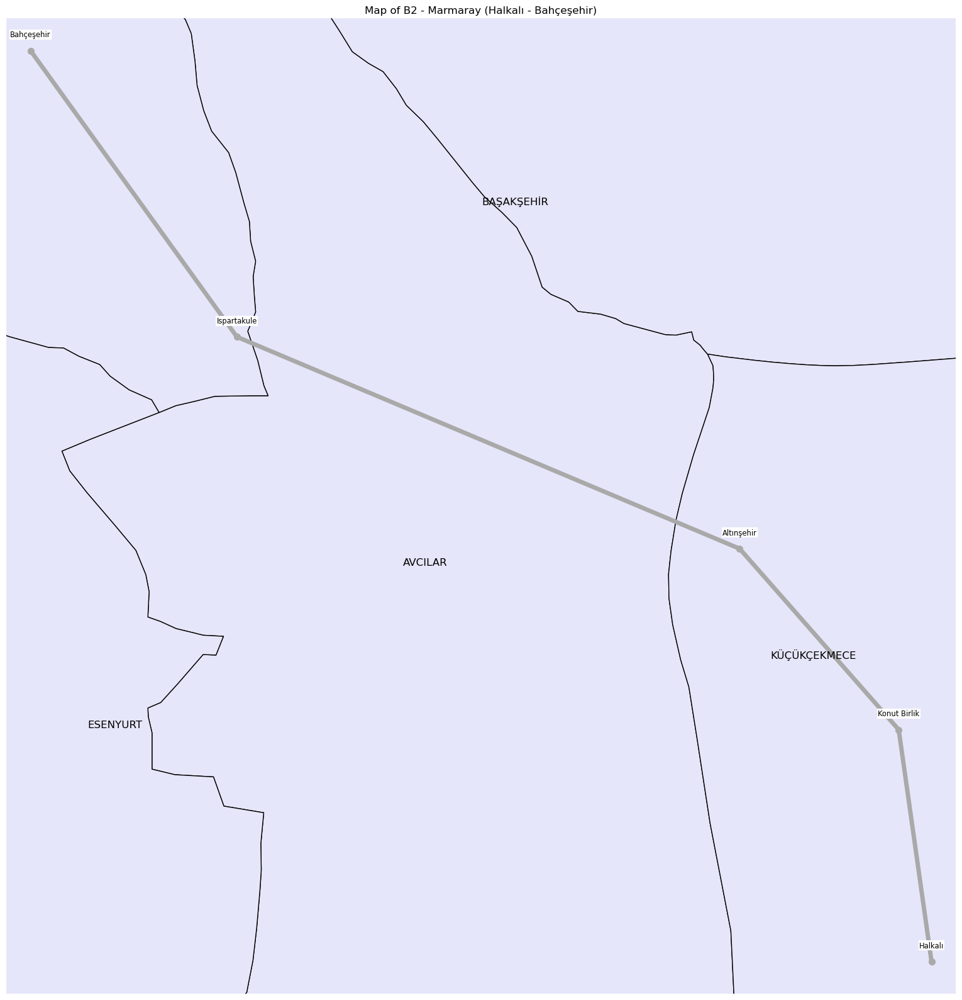

C:\Users\hilmi\AppData\Local\Temp\ipykernel_10432\466362186.py:10: UserWarning: Geometry is in a geographic CRS. Results from 'length' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  txt_frame = railway[railway.line_name == line_name].geometry.length.iloc[0] / 100
C:\Users\hilmi\AppData\Local\anaconda3\envs\geoenv\lib\site-packages\geopandas\tools\clip.py:182: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ((box_mask[0] <= box_gdf[2]) and (box_gdf[0] <= box_mask[2]))
C:\Users\hilmi\AppData\Local\anaconda3\envs\geoenv\lib\site-packages\geopandas\tools\clip.py:183: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame beha

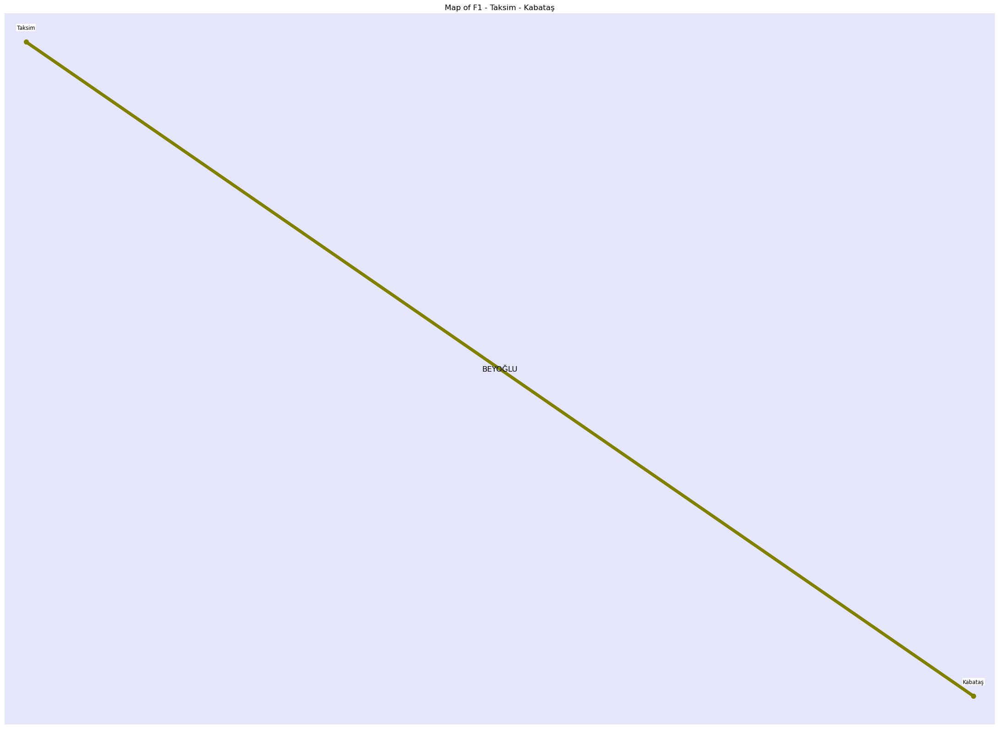

C:\Users\hilmi\AppData\Local\Temp\ipykernel_10432\466362186.py:10: UserWarning: Geometry is in a geographic CRS. Results from 'length' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  txt_frame = railway[railway.line_name == line_name].geometry.length.iloc[0] / 100
C:\Users\hilmi\AppData\Local\anaconda3\envs\geoenv\lib\site-packages\geopandas\tools\clip.py:182: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ((box_mask[0] <= box_gdf[2]) and (box_gdf[0] <= box_mask[2]))
C:\Users\hilmi\AppData\Local\anaconda3\envs\geoenv\lib\site-packages\geopandas\tools\clip.py:183: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame beha

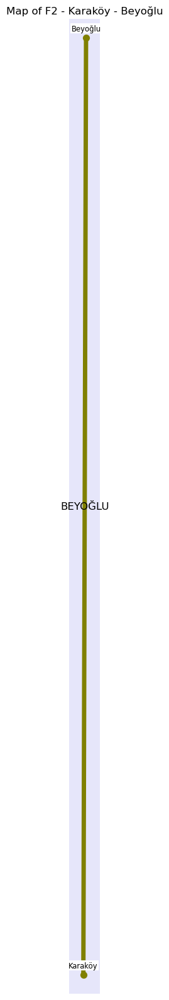

C:\Users\hilmi\AppData\Local\Temp\ipykernel_10432\466362186.py:10: UserWarning: Geometry is in a geographic CRS. Results from 'length' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  txt_frame = railway[railway.line_name == line_name].geometry.length.iloc[0] / 100
C:\Users\hilmi\AppData\Local\anaconda3\envs\geoenv\lib\site-packages\geopandas\tools\clip.py:182: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ((box_mask[0] <= box_gdf[2]) and (box_gdf[0] <= box_mask[2]))
C:\Users\hilmi\AppData\Local\anaconda3\envs\geoenv\lib\site-packages\geopandas\tools\clip.py:183: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame beha

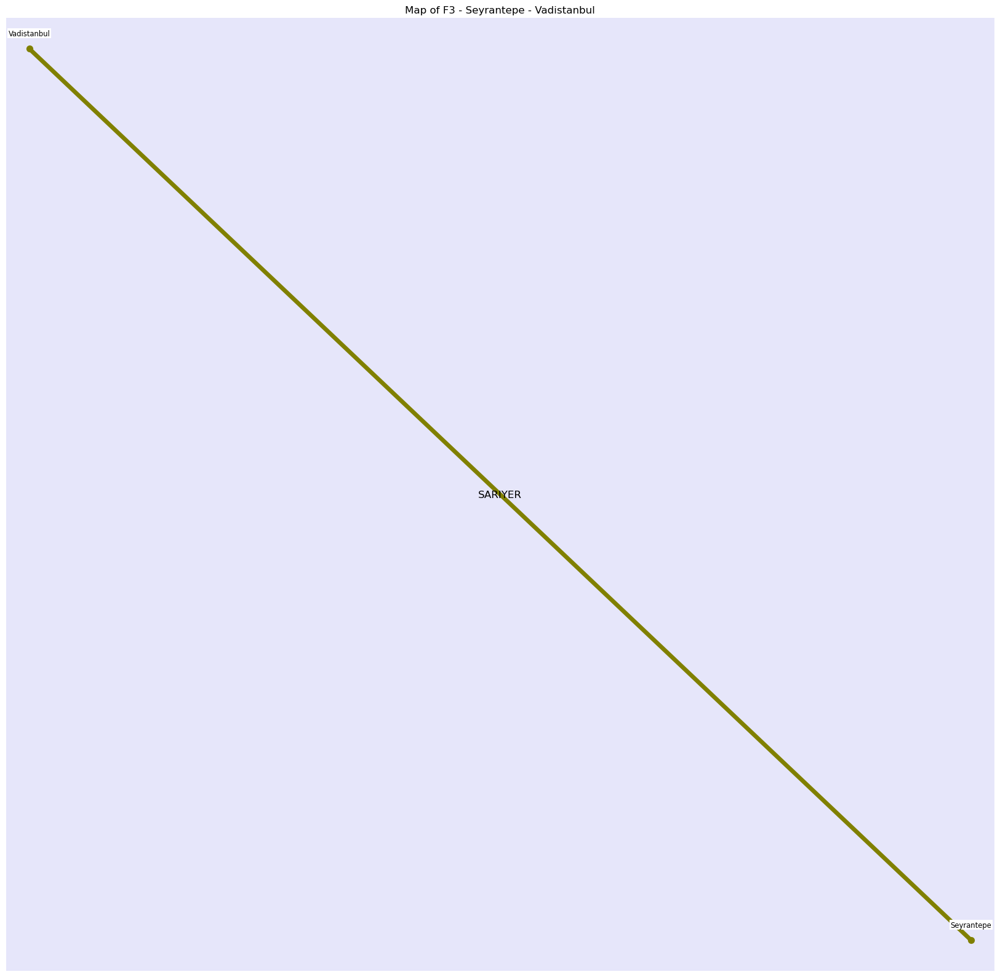

C:\Users\hilmi\AppData\Local\Temp\ipykernel_10432\466362186.py:10: UserWarning: Geometry is in a geographic CRS. Results from 'length' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  txt_frame = railway[railway.line_name == line_name].geometry.length.iloc[0] / 100
C:\Users\hilmi\AppData\Local\anaconda3\envs\geoenv\lib\site-packages\geopandas\tools\clip.py:182: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ((box_mask[0] <= box_gdf[2]) and (box_gdf[0] <= box_mask[2]))
C:\Users\hilmi\AppData\Local\anaconda3\envs\geoenv\lib\site-packages\geopandas\tools\clip.py:183: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame beha

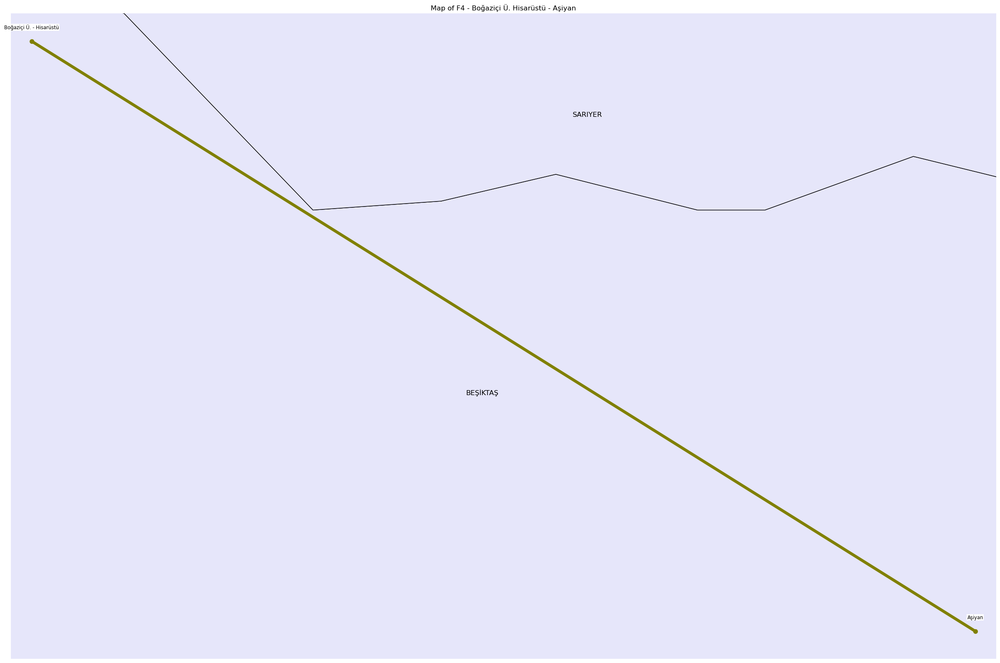

C:\Users\hilmi\AppData\Local\Temp\ipykernel_10432\466362186.py:10: UserWarning: Geometry is in a geographic CRS. Results from 'length' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  txt_frame = railway[railway.line_name == line_name].geometry.length.iloc[0] / 100
C:\Users\hilmi\AppData\Local\anaconda3\envs\geoenv\lib\site-packages\geopandas\tools\clip.py:182: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ((box_mask[0] <= box_gdf[2]) and (box_gdf[0] <= box_mask[2]))
C:\Users\hilmi\AppData\Local\anaconda3\envs\geoenv\lib\site-packages\geopandas\tools\clip.py:183: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame beha

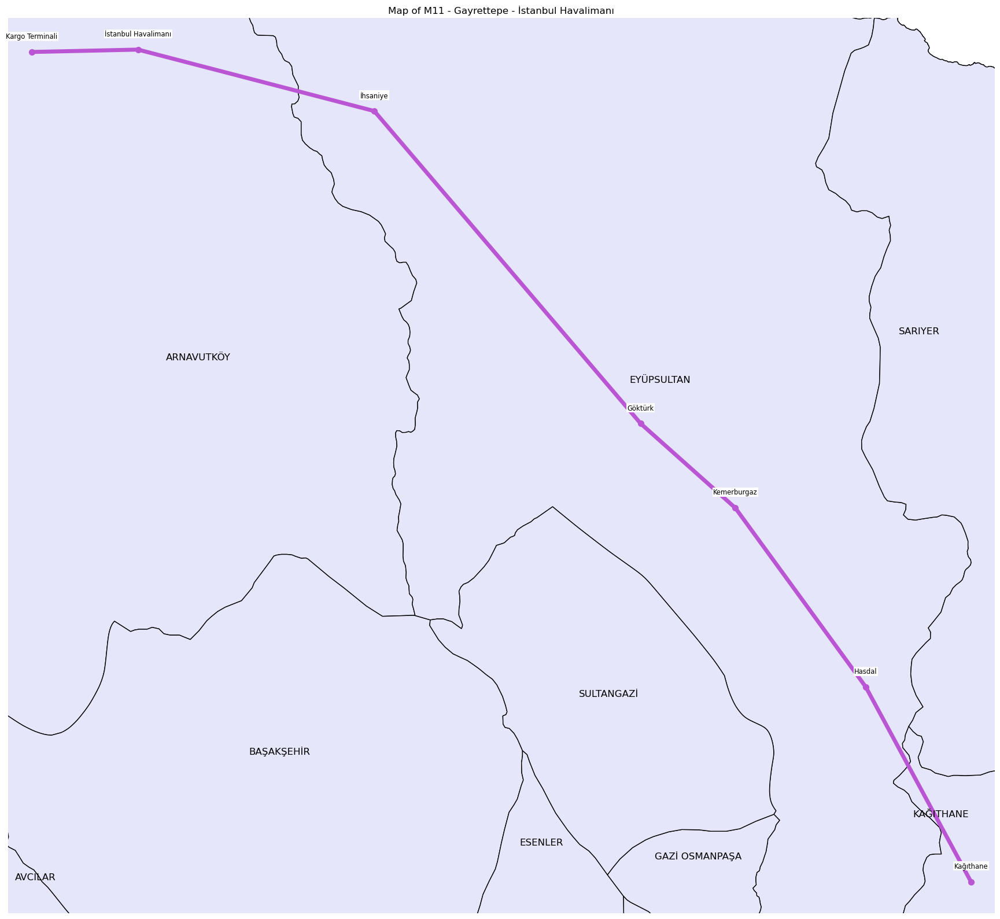

C:\Users\hilmi\AppData\Local\Temp\ipykernel_10432\466362186.py:10: UserWarning: Geometry is in a geographic CRS. Results from 'length' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  txt_frame = railway[railway.line_name == line_name].geometry.length.iloc[0] / 100
C:\Users\hilmi\AppData\Local\anaconda3\envs\geoenv\lib\site-packages\geopandas\tools\clip.py:182: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ((box_mask[0] <= box_gdf[2]) and (box_gdf[0] <= box_mask[2]))
C:\Users\hilmi\AppData\Local\anaconda3\envs\geoenv\lib\site-packages\geopandas\tools\clip.py:183: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame beha

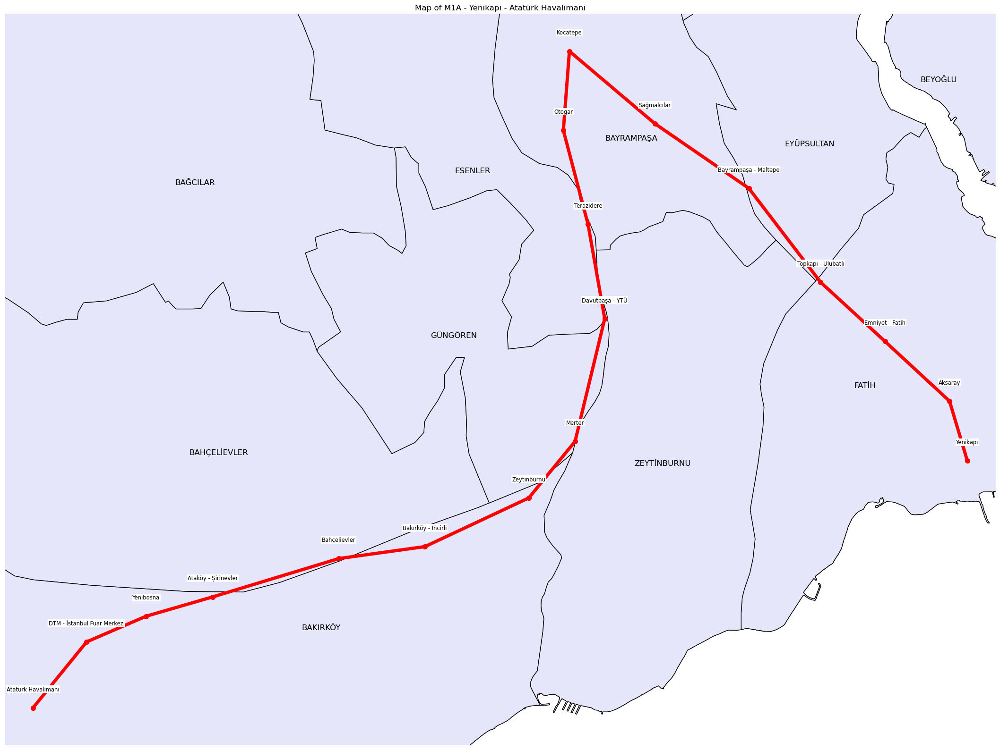

C:\Users\hilmi\AppData\Local\Temp\ipykernel_10432\466362186.py:10: UserWarning: Geometry is in a geographic CRS. Results from 'length' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  txt_frame = railway[railway.line_name == line_name].geometry.length.iloc[0] / 100
C:\Users\hilmi\AppData\Local\anaconda3\envs\geoenv\lib\site-packages\geopandas\tools\clip.py:182: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ((box_mask[0] <= box_gdf[2]) and (box_gdf[0] <= box_mask[2]))
C:\Users\hilmi\AppData\Local\anaconda3\envs\geoenv\lib\site-packages\geopandas\tools\clip.py:183: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame beha

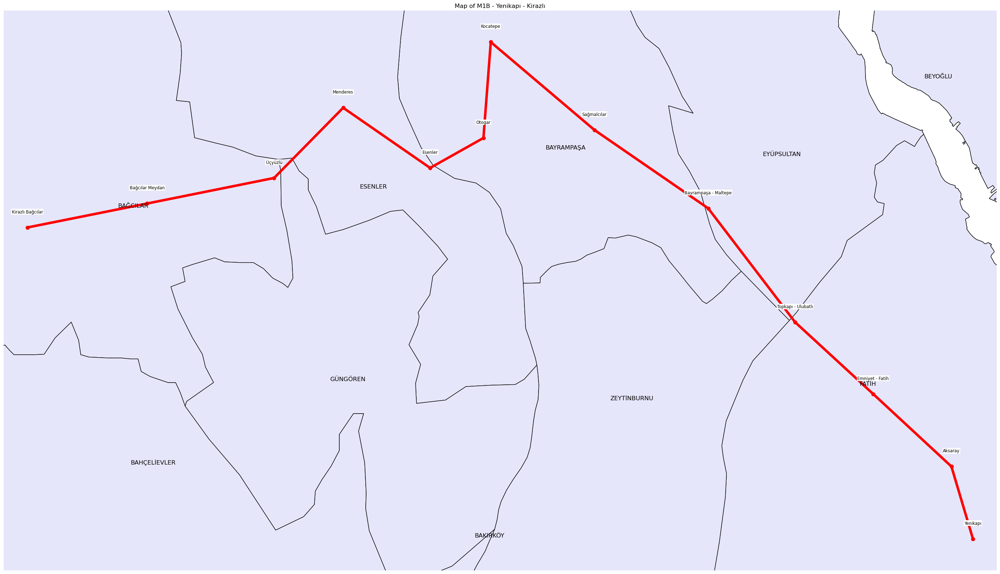

C:\Users\hilmi\AppData\Local\Temp\ipykernel_10432\466362186.py:10: UserWarning: Geometry is in a geographic CRS. Results from 'length' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  txt_frame = railway[railway.line_name == line_name].geometry.length.iloc[0] / 100
C:\Users\hilmi\AppData\Local\anaconda3\envs\geoenv\lib\site-packages\geopandas\tools\clip.py:182: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ((box_mask[0] <= box_gdf[2]) and (box_gdf[0] <= box_mask[2]))
C:\Users\hilmi\AppData\Local\anaconda3\envs\geoenv\lib\site-packages\geopandas\tools\clip.py:183: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame beha

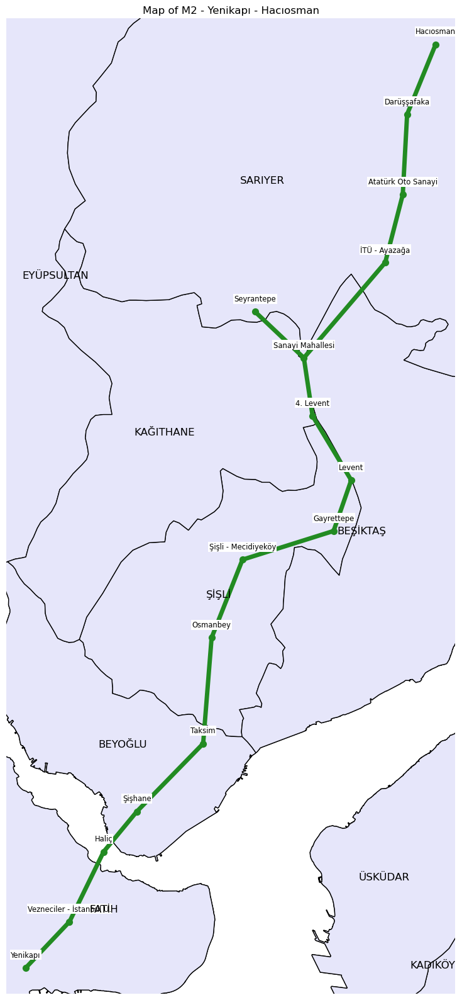

C:\Users\hilmi\AppData\Local\Temp\ipykernel_10432\466362186.py:10: UserWarning: Geometry is in a geographic CRS. Results from 'length' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  txt_frame = railway[railway.line_name == line_name].geometry.length.iloc[0] / 100
C:\Users\hilmi\AppData\Local\anaconda3\envs\geoenv\lib\site-packages\geopandas\tools\clip.py:182: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ((box_mask[0] <= box_gdf[2]) and (box_gdf[0] <= box_mask[2]))
C:\Users\hilmi\AppData\Local\anaconda3\envs\geoenv\lib\site-packages\geopandas\tools\clip.py:183: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame beha

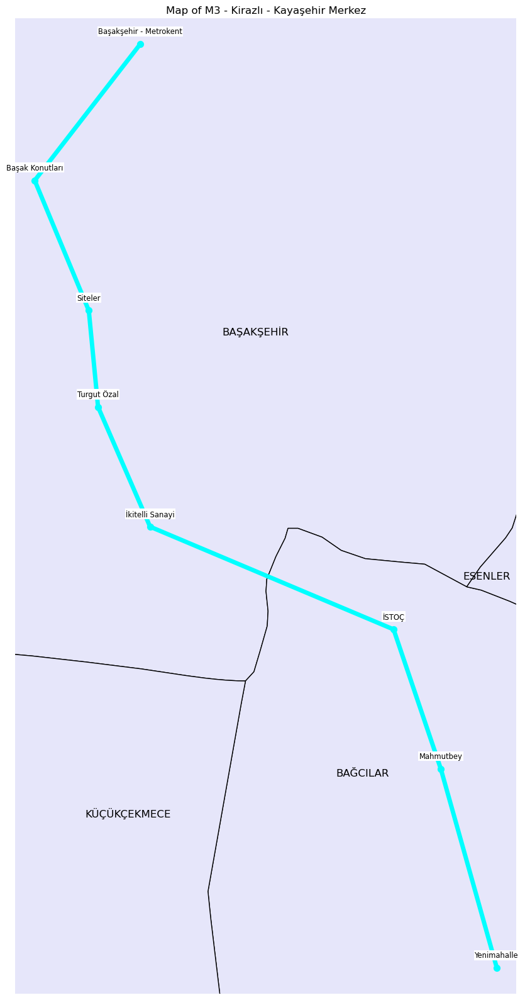

C:\Users\hilmi\AppData\Local\Temp\ipykernel_10432\466362186.py:10: UserWarning: Geometry is in a geographic CRS. Results from 'length' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  txt_frame = railway[railway.line_name == line_name].geometry.length.iloc[0] / 100
C:\Users\hilmi\AppData\Local\anaconda3\envs\geoenv\lib\site-packages\geopandas\tools\clip.py:182: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ((box_mask[0] <= box_gdf[2]) and (box_gdf[0] <= box_mask[2]))
C:\Users\hilmi\AppData\Local\anaconda3\envs\geoenv\lib\site-packages\geopandas\tools\clip.py:183: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame beha

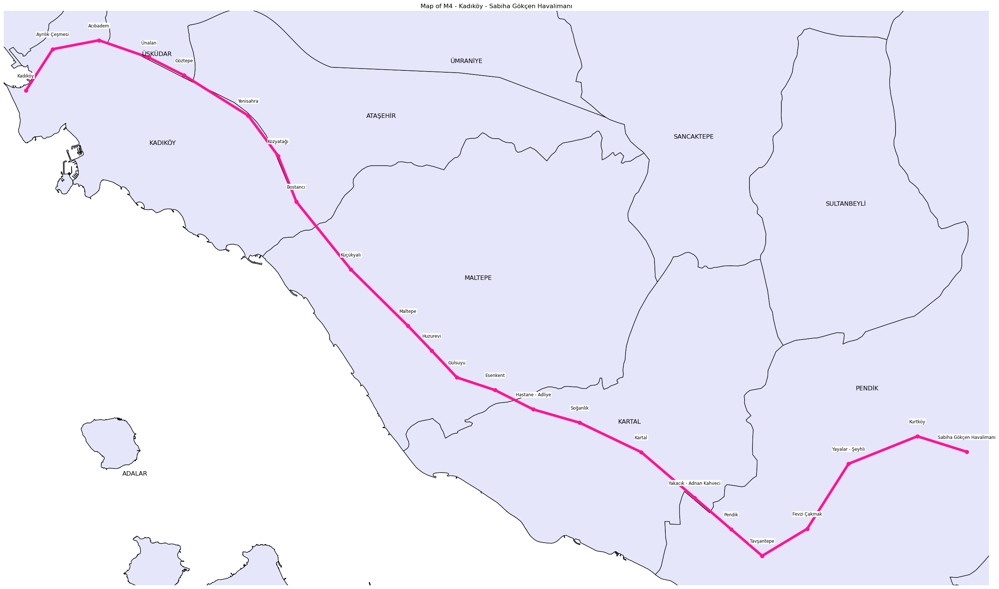

C:\Users\hilmi\AppData\Local\Temp\ipykernel_10432\466362186.py:10: UserWarning: Geometry is in a geographic CRS. Results from 'length' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  txt_frame = railway[railway.line_name == line_name].geometry.length.iloc[0] / 100
C:\Users\hilmi\AppData\Local\anaconda3\envs\geoenv\lib\site-packages\geopandas\tools\clip.py:182: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ((box_mask[0] <= box_gdf[2]) and (box_gdf[0] <= box_mask[2]))
C:\Users\hilmi\AppData\Local\anaconda3\envs\geoenv\lib\site-packages\geopandas\tools\clip.py:183: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame beha

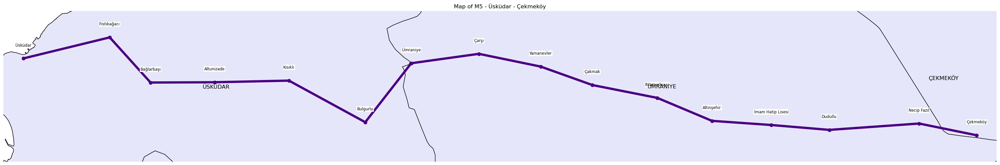

C:\Users\hilmi\AppData\Local\Temp\ipykernel_10432\466362186.py:10: UserWarning: Geometry is in a geographic CRS. Results from 'length' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  txt_frame = railway[railway.line_name == line_name].geometry.length.iloc[0] / 100
C:\Users\hilmi\AppData\Local\anaconda3\envs\geoenv\lib\site-packages\geopandas\tools\clip.py:182: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ((box_mask[0] <= box_gdf[2]) and (box_gdf[0] <= box_mask[2]))
C:\Users\hilmi\AppData\Local\anaconda3\envs\geoenv\lib\site-packages\geopandas\tools\clip.py:183: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame beha

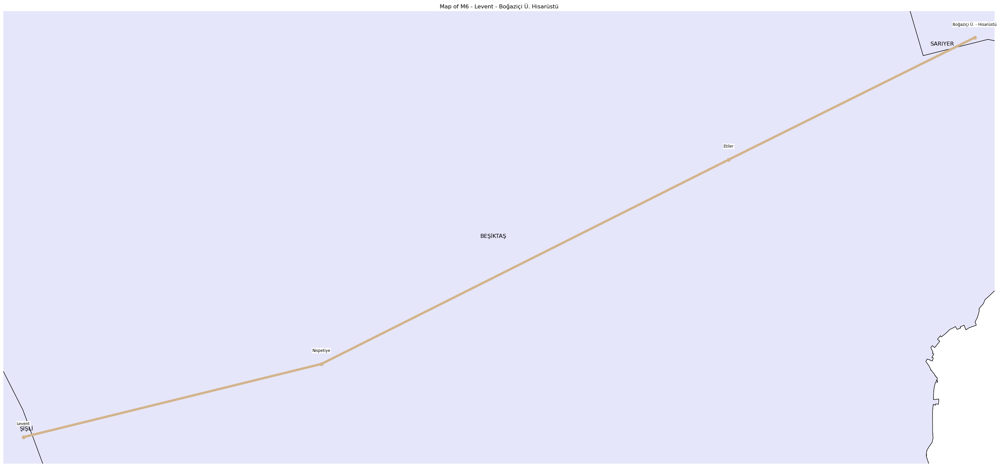

C:\Users\hilmi\AppData\Local\Temp\ipykernel_10432\466362186.py:10: UserWarning: Geometry is in a geographic CRS. Results from 'length' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  txt_frame = railway[railway.line_name == line_name].geometry.length.iloc[0] / 100
C:\Users\hilmi\AppData\Local\anaconda3\envs\geoenv\lib\site-packages\geopandas\tools\clip.py:182: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ((box_mask[0] <= box_gdf[2]) and (box_gdf[0] <= box_mask[2]))
C:\Users\hilmi\AppData\Local\anaconda3\envs\geoenv\lib\site-packages\geopandas\tools\clip.py:183: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame beha

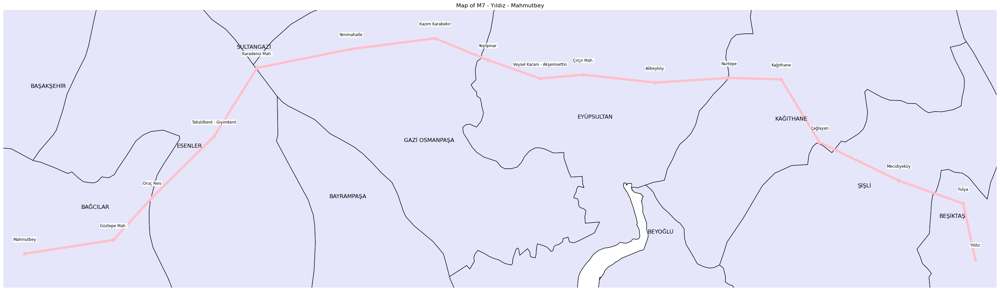

C:\Users\hilmi\AppData\Local\Temp\ipykernel_10432\466362186.py:10: UserWarning: Geometry is in a geographic CRS. Results from 'length' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  txt_frame = railway[railway.line_name == line_name].geometry.length.iloc[0] / 100
C:\Users\hilmi\AppData\Local\anaconda3\envs\geoenv\lib\site-packages\geopandas\tools\clip.py:182: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ((box_mask[0] <= box_gdf[2]) and (box_gdf[0] <= box_mask[2]))
C:\Users\hilmi\AppData\Local\anaconda3\envs\geoenv\lib\site-packages\geopandas\tools\clip.py:183: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame beha

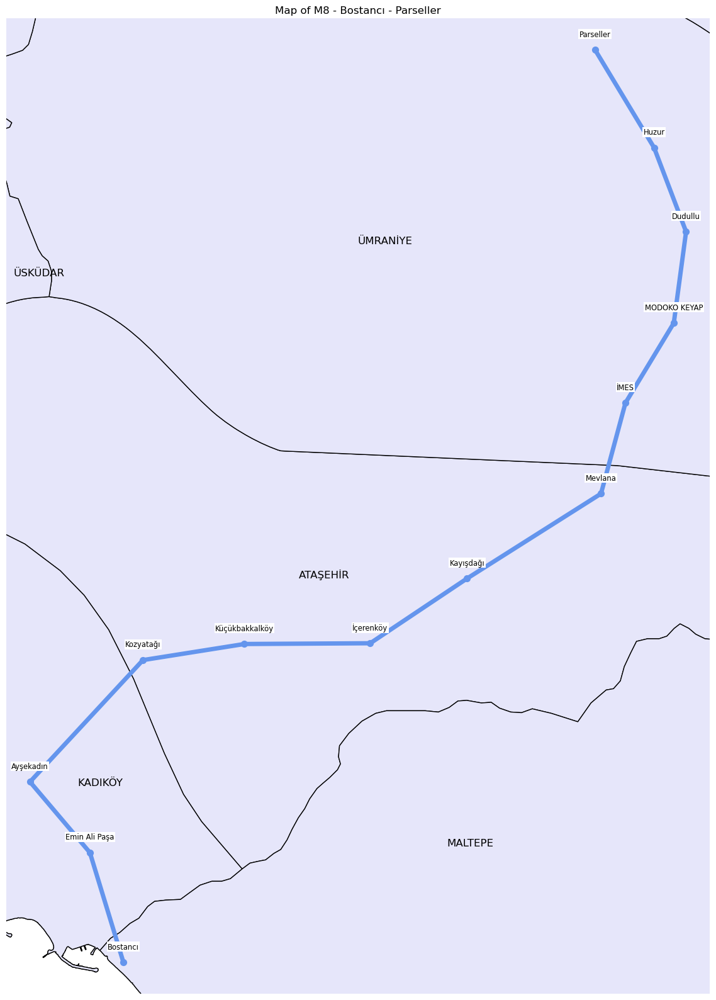

C:\Users\hilmi\AppData\Local\Temp\ipykernel_10432\466362186.py:10: UserWarning: Geometry is in a geographic CRS. Results from 'length' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  txt_frame = railway[railway.line_name == line_name].geometry.length.iloc[0] / 100
C:\Users\hilmi\AppData\Local\anaconda3\envs\geoenv\lib\site-packages\geopandas\tools\clip.py:182: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ((box_mask[0] <= box_gdf[2]) and (box_gdf[0] <= box_mask[2]))
C:\Users\hilmi\AppData\Local\anaconda3\envs\geoenv\lib\site-packages\geopandas\tools\clip.py:183: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame beha

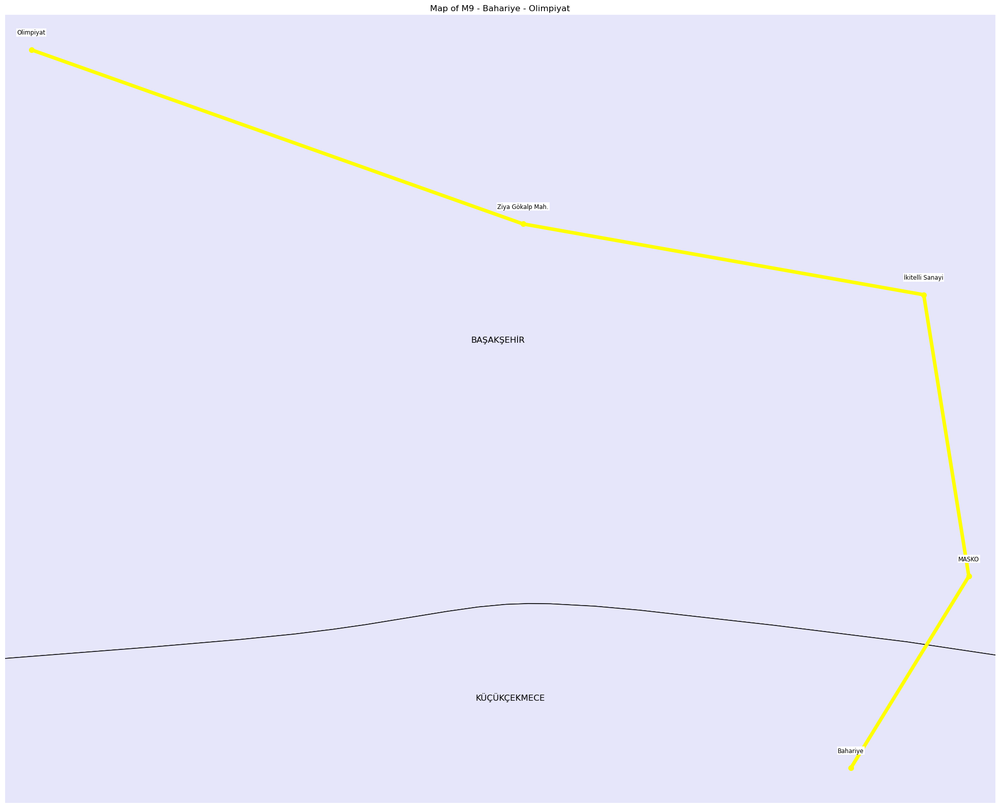

C:\Users\hilmi\AppData\Local\Temp\ipykernel_10432\466362186.py:10: UserWarning: Geometry is in a geographic CRS. Results from 'length' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  txt_frame = railway[railway.line_name == line_name].geometry.length.iloc[0] / 100
C:\Users\hilmi\AppData\Local\anaconda3\envs\geoenv\lib\site-packages\geopandas\tools\clip.py:182: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ((box_mask[0] <= box_gdf[2]) and (box_gdf[0] <= box_mask[2]))
C:\Users\hilmi\AppData\Local\anaconda3\envs\geoenv\lib\site-packages\geopandas\tools\clip.py:183: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame beha

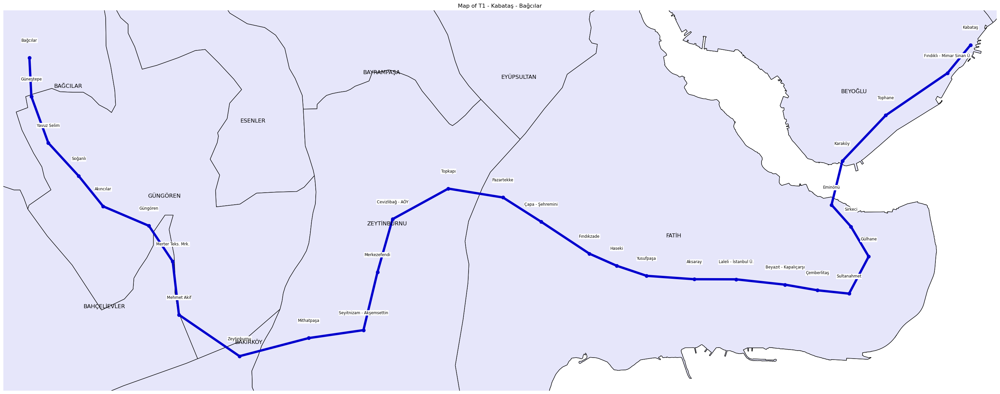

C:\Users\hilmi\AppData\Local\Temp\ipykernel_10432\466362186.py:10: UserWarning: Geometry is in a geographic CRS. Results from 'length' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  txt_frame = railway[railway.line_name == line_name].geometry.length.iloc[0] / 100
C:\Users\hilmi\AppData\Local\anaconda3\envs\geoenv\lib\site-packages\geopandas\tools\clip.py:182: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ((box_mask[0] <= box_gdf[2]) and (box_gdf[0] <= box_mask[2]))
C:\Users\hilmi\AppData\Local\anaconda3\envs\geoenv\lib\site-packages\geopandas\tools\clip.py:183: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame beha

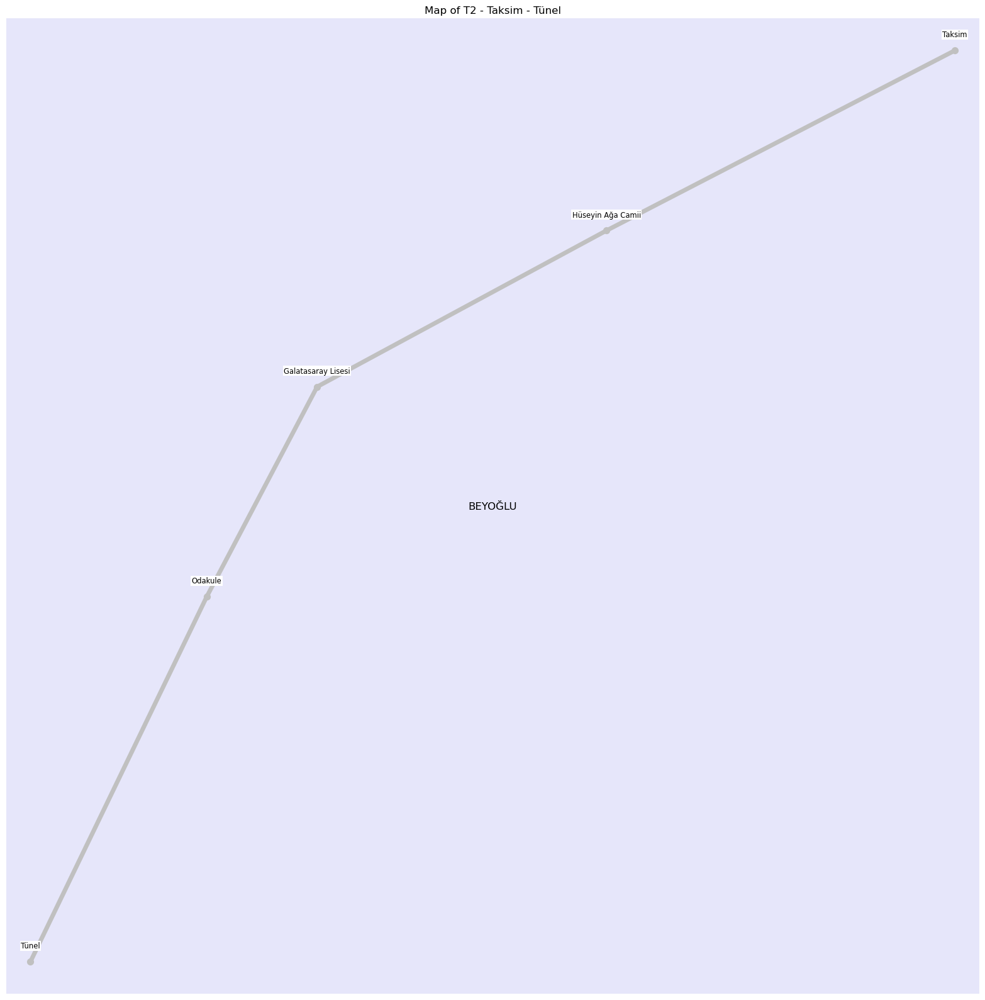

C:\Users\hilmi\AppData\Local\Temp\ipykernel_10432\466362186.py:10: UserWarning: Geometry is in a geographic CRS. Results from 'length' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  txt_frame = railway[railway.line_name == line_name].geometry.length.iloc[0] / 100
C:\Users\hilmi\AppData\Local\anaconda3\envs\geoenv\lib\site-packages\geopandas\tools\clip.py:182: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ((box_mask[0] <= box_gdf[2]) and (box_gdf[0] <= box_mask[2]))
C:\Users\hilmi\AppData\Local\anaconda3\envs\geoenv\lib\site-packages\geopandas\tools\clip.py:183: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame beha

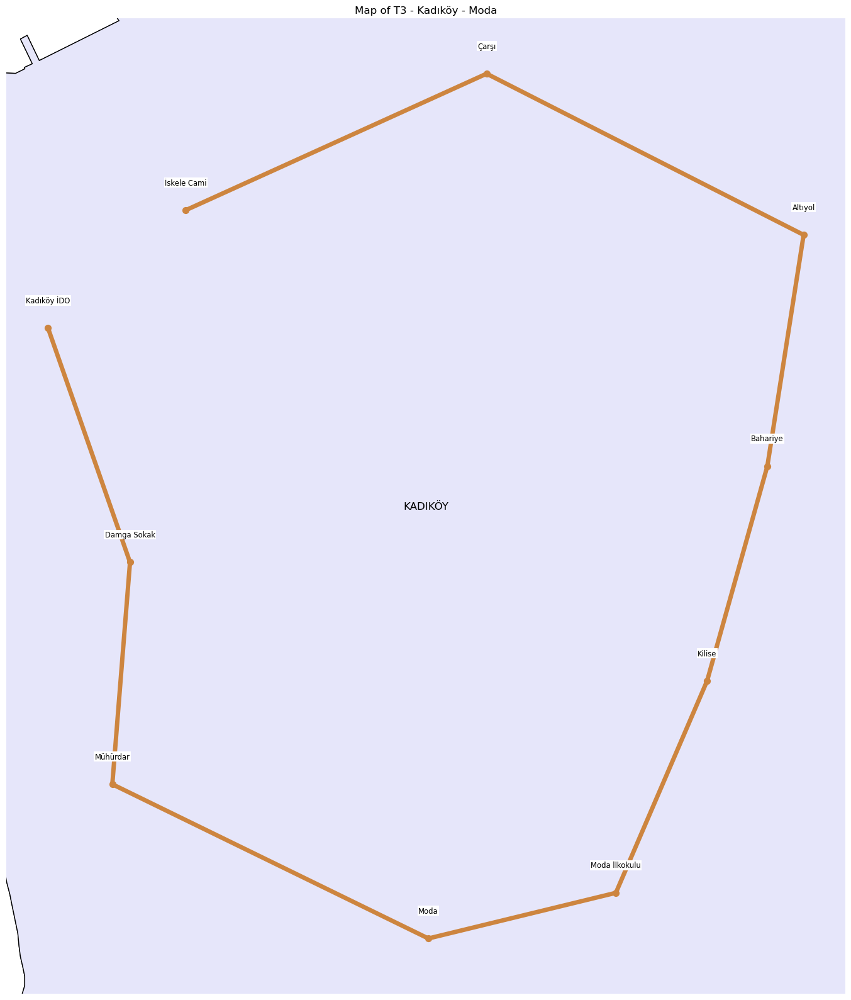

C:\Users\hilmi\AppData\Local\Temp\ipykernel_10432\466362186.py:10: UserWarning: Geometry is in a geographic CRS. Results from 'length' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  txt_frame = railway[railway.line_name == line_name].geometry.length.iloc[0] / 100
C:\Users\hilmi\AppData\Local\anaconda3\envs\geoenv\lib\site-packages\geopandas\tools\clip.py:182: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ((box_mask[0] <= box_gdf[2]) and (box_gdf[0] <= box_mask[2]))
C:\Users\hilmi\AppData\Local\anaconda3\envs\geoenv\lib\site-packages\geopandas\tools\clip.py:183: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame beha

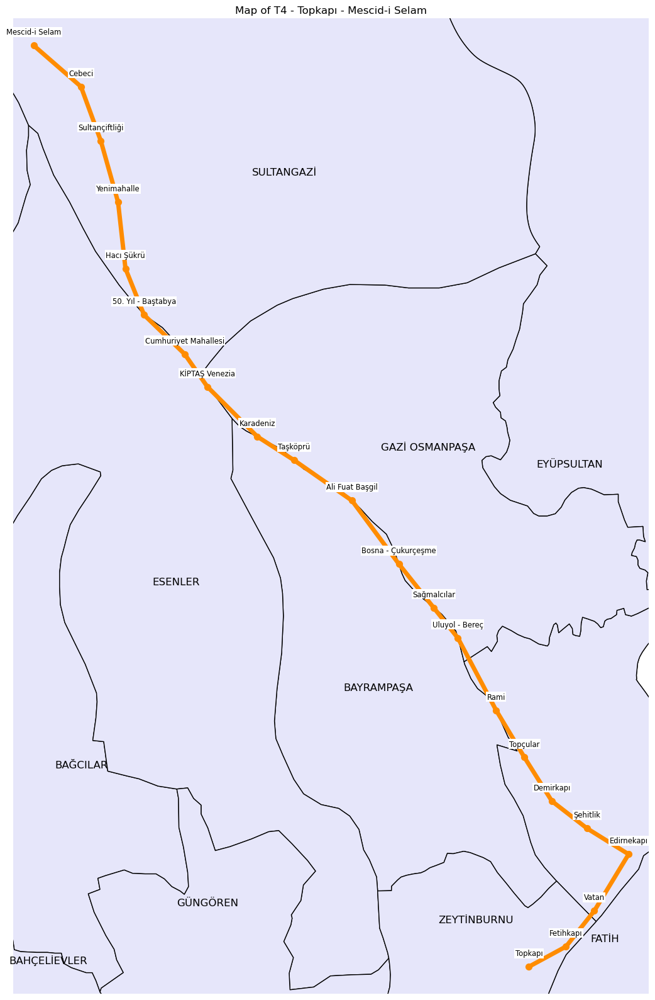

C:\Users\hilmi\AppData\Local\Temp\ipykernel_10432\466362186.py:10: UserWarning: Geometry is in a geographic CRS. Results from 'length' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  txt_frame = railway[railway.line_name == line_name].geometry.length.iloc[0] / 100
C:\Users\hilmi\AppData\Local\anaconda3\envs\geoenv\lib\site-packages\geopandas\tools\clip.py:182: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ((box_mask[0] <= box_gdf[2]) and (box_gdf[0] <= box_mask[2]))
C:\Users\hilmi\AppData\Local\anaconda3\envs\geoenv\lib\site-packages\geopandas\tools\clip.py:183: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame beha

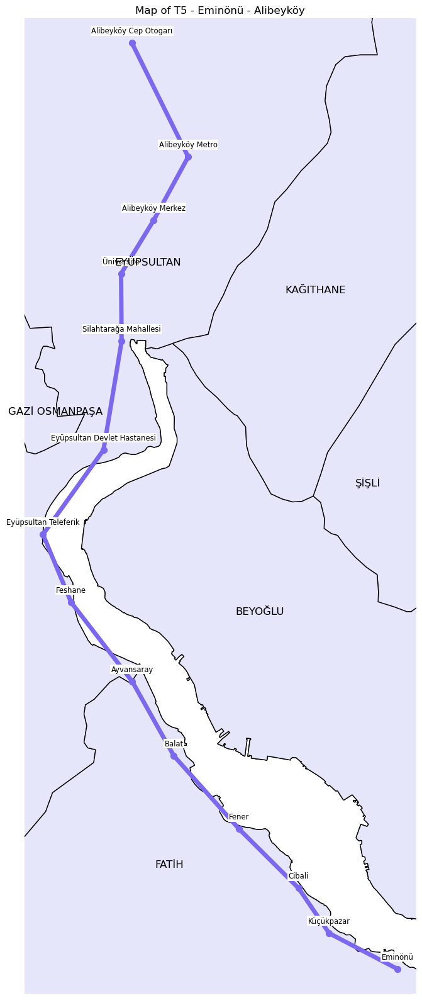

C:\Users\hilmi\AppData\Local\Temp\ipykernel_10432\466362186.py:10: UserWarning: Geometry is in a geographic CRS. Results from 'length' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  txt_frame = railway[railway.line_name == line_name].geometry.length.iloc[0] / 100
C:\Users\hilmi\AppData\Local\anaconda3\envs\geoenv\lib\site-packages\geopandas\tools\clip.py:182: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ((box_mask[0] <= box_gdf[2]) and (box_gdf[0] <= box_mask[2]))
C:\Users\hilmi\AppData\Local\anaconda3\envs\geoenv\lib\site-packages\geopandas\tools\clip.py:183: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame beha

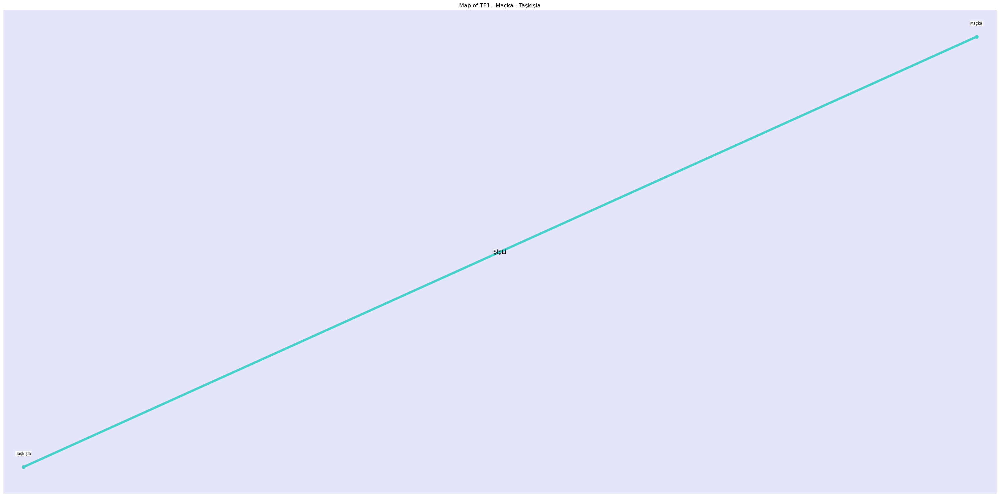

C:\Users\hilmi\AppData\Local\Temp\ipykernel_10432\466362186.py:10: UserWarning: Geometry is in a geographic CRS. Results from 'length' are likely incorrect. Use 'GeoSeries.to_crs()' to re-project geometries to a projected CRS before this operation.

  txt_frame = railway[railway.line_name == line_name].geometry.length.iloc[0] / 100
C:\Users\hilmi\AppData\Local\anaconda3\envs\geoenv\lib\site-packages\geopandas\tools\clip.py:182: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame behavior). To access a value by position, use `ser.iloc[pos]`
  ((box_mask[0] <= box_gdf[2]) and (box_gdf[0] <= box_mask[2]))
C:\Users\hilmi\AppData\Local\anaconda3\envs\geoenv\lib\site-packages\geopandas\tools\clip.py:183: FutureWarning: Series.__getitem__ treating keys as positions is deprecated. In a future version, integer keys will always be treated as labels (consistent with DataFrame beha

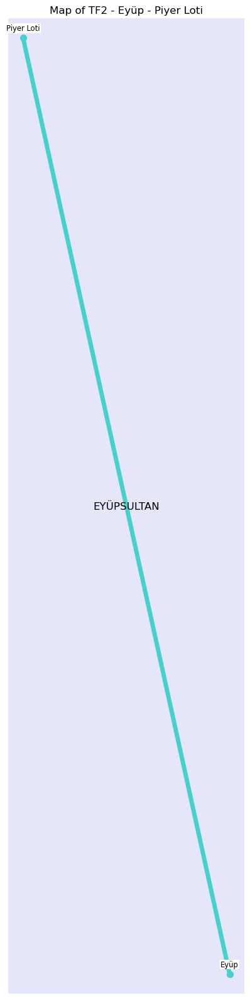

In [62]:
for name in railway.line_name:
    plot_railline(name)